In [2]:
import os
import datetime as dt

import pandas as pd
import numpy as np

import re

import random

import warnings
warnings.filterwarnings('ignore')

In [3]:
##Dash and plotting tools

import matplotlib.pyplot as plt
import seaborn as sns
from jupyter_dash import JupyterDash
from dash import html, dcc
from dash.dependencies import Output, Input
import dash_bootstrap_components as dbc
from dash.exceptions import PreventUpdate

import plotly.express as px
# import plotly.graph_objs as go
import plotly.graph_objects as go
from plotly.graph_objs.scatter import Line
from plotly.subplots import make_subplots
sns.set()

In [4]:
# os.listdir('../Data_Files')

In [5]:
#Listings of Ny
ny_listings = pd.read_csv("../Data_Files/NewYork_Listings.csv", low_memory=False)
ny_listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,225,30,48,2019-11-04,0.31,3,308,0,NaN
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.32,2,365,0,NaN
2,5136,"Spacious Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,21,2,2021-08-08,0.02,1,250,1,NaN
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,536,2022-05-09,3.37,1,172,62,NaN
4,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.76,1,0,0,NaN


In [6]:
##create neighbourhood listings of ny

ny_neigh_group = ny_listings[['id','neighbourhood_group','neighbourhood','availability_365','price']]
ny_neigh_group.sort_values(by='id')
ny_neigh_group.rename(columns = {'id':'listing_id'}, inplace = True)

In [7]:
'''
Neighborhoods of NY.  There are 5 NY neighbourhood groupings and several neighbourhoods per grouping.
'''
ny_nbh = pd.read_csv("../Data_Files/neighbourhoods.csv", low_memory=False)

ny_nbh.neighbourhood_group.unique()


array(['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island'],
      dtype=object)

In [8]:
## NY calendar dataframe --  Lists availability on a given date
ny_cal = pd.read_csv("../Data_Files/calendar.csv.gz", compression="gzip", header=0, sep=",")

### EDA on Airbnb calendar data for NYC

In [9]:
ny_cal.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2595,2022-06-04,f,$225.00,$225.00,30.0,1125.0
1,2595,2022-06-05,f,$225.00,$225.00,30.0,1125.0
2,2595,2022-06-06,f,$225.00,$225.00,30.0,1125.0
3,2595,2022-06-07,f,$225.00,$225.00,30.0,1125.0
4,2595,2022-06-08,f,$225.00,$225.00,30.0,1125.0


In [10]:
#len(ny_cal.listing_id.unique())  #37395 unique listing ids
ny_cal_uniqueID = ny_cal.listing_id.unique()
merged = pd.merge(ny_cal, ny_neigh_group, on='listing_id', how='outer')
merged = merged.dropna()

# num_list = []
# for number in range(5):
#     num_list.append(random.choice(ny_cal_uniqueID))

# ny_unique = ny_cal[ny_cal['listing_id'].isin(num_list)]

   

In [11]:
##Sample of availability through 2023

# merged = merged.sample(n=10000,random_state=1)

'''
Due to the size of the calendar.csv and processing power, a random sample of neighborhoods was chosen.  This 
causes the dates to misalign.
Sorting by date causes unwanted effects and does not properly show ledgend.  Future code will include a dropdown
or date picker
'''
merged['date'] = pd.to_datetime(merged['date'])
merged = merged.sort_values('date', ascending=True)
merged['date'] = merged['date'].dt.strftime('%m-%d-%Y')
merged = merged.sample(n=50000,random_state=1)



# px.scatter(data_frame=merged,
#           x='availability_365',
#           y='minimum_nights',
#           size='price_y',
#            animation_group='neighbourhood_group',
#           color='neighbourhood_group',
#           log_x=False,
#           animation_frame='date',
#            height=600,
#            size_max=90)

In [11]:
# df_list=[]

# Bronx = merged[merged['neighbourhood_group']== 'Bronx']

# for name in merged.neighbourhood_group.unique():
#     new =name+'_df'
#     new = merged[merged['neighbourhood_group'] == name]
#     df_list.append(new)


In [12]:
fig = px.scatter(data_frame=merged,
          x='availability_365',
          y='minimum_nights',
          size='price_y',
           animation_group='neighbourhood_group',
          color='neighbourhood_group',
          log_x=False,
          animation_frame='date',
           height=900,
           width=900,
           size_max=90,facet_row='neighbourhood_group')
fig.for_each_annotation(lambda a: a.update(text=a.text.replace("neighbourhood_group=", "")))
fig.for_each_annotation(lambda a: a.update(text=a.text.replace("neighbourhood_group=", "")))
fig.for_each_trace(lambda t: t.update(name=t.name.replace("neighbourhood_group=", "")))
fig.show()
# fig.update_yaxes()

In [13]:
ny_cal.describe().drop("listing_id", axis=1)

,minimum_nights,maximum_nights
count,1.364882e+07,1.364882e+07
mean,2.698060e+01,2.322437e+06
std,7.819838e+01,7.055527e+07
min,1.000000e+00,1.000000e+00
25%,2.000000e+00,3.650000e+02
50%,3.000000e+01,1.125000e+03
75%,3.000000e+01,1.125000e+03
max,1.250000e+03,2.147484e+09


In [14]:
print("Unique listings in NYC:", len(ny_cal.listing_id.unique()))

Unique listings in NYC: 37395


#### Clean price column and summarize mean

In [15]:
# remove na in price column
ny_cal_cut = ny_cal[ny_cal.price.notna()]

# clean price column
new_price = [ p.replace("$", "").replace(",", "") for p in ny_cal_cut.price ]
ny_cal_cut.price = new_price
ny_cal_cut.price = round(ny_cal_cut.price.astype("float"), 2)

ny_cal_cut.price.describe().apply("{0:.4f}".format)

count    13649007.0000
mean          195.1919
std           375.8150
min             0.0000
25%            78.0000
50%           125.0000
75%           204.0000
max         48800.0000
Name: price, dtype: object

In [16]:
# summarize price by mean price by listing
ny_mean_price = ny_cal_cut.groupby("listing_id")["price"].mean().reset_index(name="mean")

ny_mean_price

,listing_id,mean
0,2595,213.495890
1,5121,60.000000
2,5136,275.000000
3,5178,68.147945
4,5203,78.635616
...,...,...
37390,640612171111039003,180.000000
37391,640629990855220048,620.000000
37392,640658348674867448,92.589041
37393,641072234133563797,528.616438


#### Cast date column to datetime type & visualize prices by day

In [17]:
# cast to date
ny_cal_cut['date'] = pd.to_datetime(ny_cal_cut['date'])

In [18]:
# summarize mean price
ny_price_day = ny_cal_cut.groupby("date")["price"].mean().reset_index(name="mean_price")

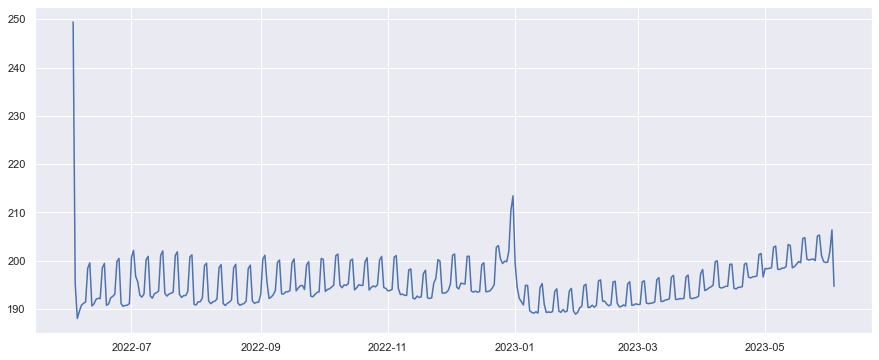

In [19]:
# visualize mean price by day
plt.figure(figsize=(15,6))
plt.plot(ny_price_day.date, ny_price_day.mean_price)
plt.show()

fix = px.line(ny_price_day, x='date',y='mean_price')
fix.show()

#### Model Selection

In [20]:
from sklearn.model_selection import train_test_split

def split_data(data):
    train, test_and_validate = train_test_split(data, test_size=0.2, random_state=9, stratify=data['date'])
    test, validate = train_test_split(test_and_validate, test_size=0.5, random_state=9, stratify=test_and_validate['date'])
    return train, validate, test

In [21]:
# x value will be prices
data = ny_cal_cut[["date", "price"]]

data['date'] = data['date'].map(dt.datetime.toordinal)

train, validate, test = split_data(data)
print("Train data size: ", train['date'].size)
print("Test data size: ", test['date'].size)
print("Validate data size: ", validate['date'].size)

Train data size:  10919205
Test data size:  1364901
Validate data size:  1364901


In [22]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()

In [23]:
X_train = train["date"].values.reshape(-1, 1)
y_train = train["price"].values.reshape(-1, 1)

reg.fit(X_train, y_train)

LinearRegression()

In [24]:
X_test = test["date"].values.reshape(-1, 1)
y_test = test["price"].values.reshape(-1, 1)

preds = reg.predict(X_test)

In [25]:
reg.score(y_test, preds)

-49097103.23858913

#### Arima/Rolling Average

In [26]:
from statsmodels.tsa.arima.model import ARIMA
from datetime import datetime  
from datetime import timedelta  

def arma_log_ret(ser, p, q, num_forecasts):
    df = ser.reset_index()
    start = df['date'].iloc[-1] + timedelta(days=1)  

    model = ARIMA(ser,order=(p,0,q)).fit()
    forecasts = model.predict(start = start, end = start + timedelta(days=num_forecasts-1))
    
    return forecasts


def calc_rolling_stats(ser, wd_size=7):
    rolling_mean = ser.rolling(wd_size, min_periods=1).mean().to_numpy()
    
    if wd_size == 1:
        rolling_std = ser.rolling(wd_size).std(ddof=0).to_numpy()
    else:
        rolling_std = ser.rolling(wd_size, min_periods=1).std(ddof=0).to_numpy()
    
    return rolling_mean, rolling_std
    
def calc_log_ret(ser):
    log_ret = np.log(ser) - np.log(ser.shift(1))
    
    log_ret.dropna(inplace=True)
    
    return log_ret

In [28]:
# summarize price by mean price by day
ny_mean_dailyprice = ny_cal_cut.groupby("date")["price"].mean().reset_index(name="mean_price")

ny_mean_dailyprice.mean_price = round(ny_mean_dailyprice.mean_price, 2)

In [29]:
rolling_mean, rolling_std = calc_rolling_stats(ny_mean_dailyprice, wd_size=7)

In [30]:
rolling_mean.shape

(366, 1)

In [31]:
rolling_std.shape

(366, 1)

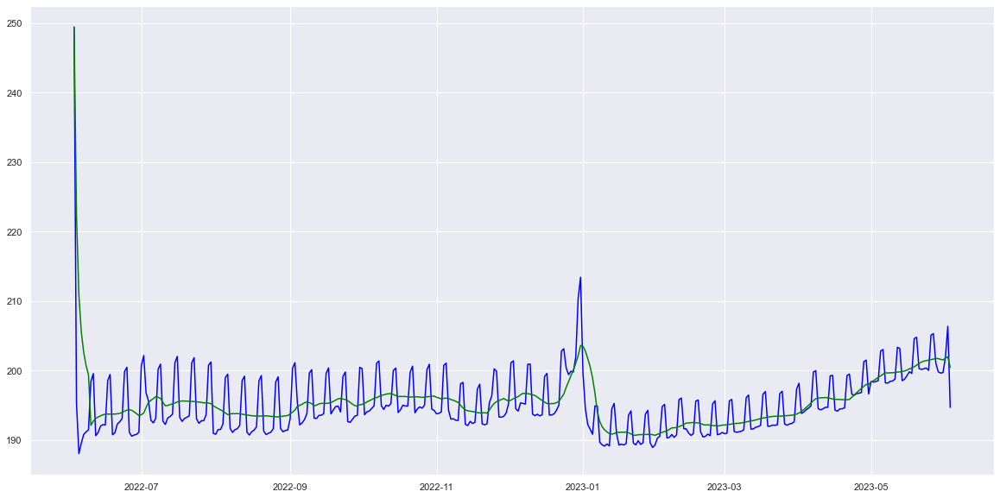

In [32]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(ny_mean_dailyprice.date, ny_mean_dailyprice.mean_price, color='blue')
ax.plot(ny_mean_dailyprice.date, pd.Series(rolling_mean.reshape(366,)), color='green')
# ax.plot(ny_mean_dailyprice.date, pd.Series(rolling_std.reshape(366,)), color='orange')

plt.show()

df10 = ny_mean_dailyprice

fig=px.line(df10, x='date',y=[ny_mean_dailyprice.mean_price,
                              pd.Series(rolling_mean.reshape(366))])
fig.show()



In [33]:
ny_mean_dailyprice = ny_cal_cut.groupby("date")["price"].mean().reset_index(name="mean_price")

ny_mean_dailyprice.mean_price = round(ny_mean_dailyprice.mean_price, 2)

ser = ny_mean_dailyprice
p=1
q=1
num_forecasts=365

df = ser.reset_index()
# start = df['date'].iloc[-1] + timedelta(days=1) 

# ser.index = pd.to_datetime(ser.date)
# ser = ser.resample("M").last()

start = df['date'].iloc[-1] + timedelta(days=1) 

df = ser.set_index("date")

end = start + timedelta(days=364)
model = ARIMA(df,order=(p,0,q), freq='D').fit()

forecasts = model.predict(start = start, end = end)

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



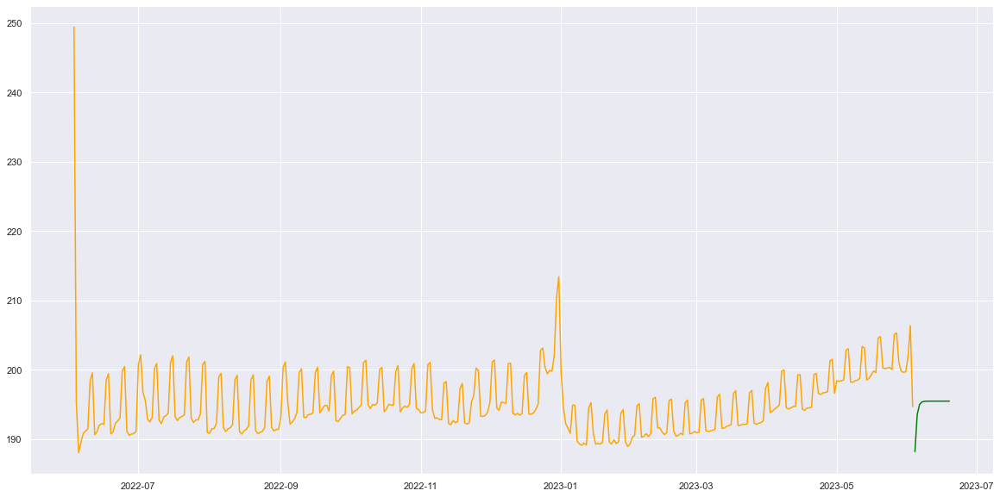

In [34]:
forecast_df = forecasts.reset_index()
forecast_df = forecast_df.rename(columns={'index':'date'})
forecast_df = forecast_df.loc[:15, :]

fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(ny_mean_dailyprice.date, ny_mean_dailyprice.mean_price, label="Original", color='orange')
ax.plot(forecast_df.date, forecast_df.predicted_mean, label="Forecasted", color='green')

plt.show()

In [12]:
external_stylesheets = [dbc.themes.BOOTSTRAP]
app = JupyterDash(__name__,external_stylesheets=external_stylesheets)

In [14]:
app.layout = html.Div([
    html.H1('Airbnb Explorers'),
    dcc.Dropdown(id='neighbourhood_group',
                options=[{'label': neighbourhood_group, 'value': neighbourhood_group}
                        for neighbourhood_group in merged['neighbourhood_group'].unique()]),
    html.Br(),
    html.Div(id='report'),
    html.Br()
])

@app.callback(Output('report', 'children'),
             Input('neighbourhood_group','value'))
def display_neighbourhood_group(neighbourhood_group):
    if neighbourhood_group is None:
        return ''
    group_filt = merged.groupby('neighbourhood_group', as_index=False)['price_y'].mean()
    filtered = group_filt[group_filt['neighbourhood_group']==neighbourhood]
    price = filtered.loc[:, 'price_y'].values[0]
    return [html.H3(neighbourhood_group),
           f'The average price in {neighbourhood_group} is {price:,.0f}.']


In [15]:
app.run_server(mode='external',port=8051)

Dash app running on http://127.0.0.1:8051/
